# RL (simple) example using Gym environment

## Machine setup

In [1]:
# Stable Baselines only supports tensorflow 1.x for now
%tensorflow_version 1.x
!apt-get update && sudo apt-get install cmake libopenmpi-dev zlib1g-dev
!apt-get install ffmpeg freeglut3-dev xvfb  # For visualization
#!apt-get install -y xvfb x11-utils
!apt install swig
!pip install stable-baselines[mpi]==2.10.0 box2d 

TensorFlow 1.x selected.
Get:1 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Get:2 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran35/ InRelease [3,626 B]
Ign:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Hit:4 http://archive.ubuntu.com/ubuntu bionic InRelease
Hit:5 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic InRelease
Ign:6 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Hit:7 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release
Hit:8 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Get:9 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Get:10 http://ppa.launchpad.net/marutter/c2d4u3.5/ubuntu bionic InRelease [15.4 kB]
Get:11 http://security.ubuntu.com/ubuntu bionic-security/restricted amd64 Packages [59.3 kB]
Get:12 http://security.ubuntu.com/ubuntu b

## Imports

In [0]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [3]:
import stable_baselines
stable_baselines.__version__

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.



'2.10.0'

In [0]:
import os
import sys
import shutil
import traceback

import gym
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf

from stable_baselines import DDPG, TD3, SAC
from stable_baselines import A2C, ACER, ACKTR, DQN, DDPG, PPO1, PPO2, TRPO
from stable_baselines.common import set_global_seeds
from stable_baselines.ddpg.policies import LnMlpPolicy
from stable_baselines.bench import Monitor
from stable_baselines.common.vec_env import DummyVecEnv, VecCheckNan
from stable_baselines.results_plotter import load_results, ts2xy
from stable_baselines.common.noise import AdaptiveParamNoiseSpec, NormalActionNoise
from stable_baselines.common.callbacks import BaseCallback, EvalCallback, StopTrainingOnRewardThreshold

from stable_baselines.common.evaluation import evaluate_policy

In [5]:
!pip install pydrive                             
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive

## Setup Gym environment

### Cartpole

<img src="https://storage.cloud.google.com/bsuite-colab-images/cartpole.png" alt="cartpole diagram" height="300"/>

A classic benchmark problem in RL.
The agent controls a cart on a frictionless plane.

- The poles starts near-to upright.
- The goal is to prevent it from falling over by increasing and reducing the cart's velocity.
- The observations are [$x$, $\dot{x}$, $sin(\theta)$, $sin(\dot{\theta})$, $cos(\theta)$, $cos(\dot{\theta})$, $t_{elapsed}$]
- The actions are [0 - Push cart to the left, 1	- Push cart to the right]
- Episodes end once 1000 steps have occured, or |x| is greater than 1.
- At starting state all observations are assigned a uniform random value between ±0.05.
- Reward of +1 (for every step taken, including the termination step) when pole > 0.8 height.
- Run 1000 episodes for 20 seeds.
- Score is percentage of timesteps balancing the pole.
- Must log `episode`, `total_regret` for standard analysis.

For the challenge:

- Considered solved when the average reward is greater than or equal to 195.0 over 100 consecutive trials.

In [0]:
env_name_discrete = 'CartPole-v1'

In [0]:
MODEL_LIST_DISCRETE = {
    "A2Cd":A2C,
    #ACER,
    #ACKTR,
    "DQN":DQN,
    "DDQN": DQN,
    "DueDQN": DQN,
    "PER": DQN,
    #PPO1,
    #PPO2,
    "TRPO":TRPO
}

In [0]:
MODEL_LIST_CONTINUOUS = {
    "A2Cc":A2C,
    "DDPG":DDPG
}

In [0]:
thr_reward = 195.0

In [10]:
log_models_base = '/tmp/models/'
log_dir_base = '/tmp/logs/'
log_dir_call_base = '/tmp/logs/callback/'
log_dir_tsbd_base = '/tmp/logs/tensorboard/'
log_dir_call = os.path.join(log_dir_call_base, env_name_discrete)
log_dir_tsbd = os.path.join(log_dir_tsbd_base, env_name_discrete)
log_dir_models = os.path.join(log_models_base, env_name_discrete)
print(f"Dir log callbacks: {log_dir_call} \nDir log tensorboard: {log_dir_tsbd} \nDir log models: {log_dir_models}")

Dir log callbacks: /tmp/logs/callback/CartPole-v1 
Dir log tensorboard: /tmp/logs/tensorboard/CartPole-v1 
Dir log models: /tmp/models/CartPole-v1


In [0]:
def remove_create_folder(dirname):
  if os.path.exists(dirname):
      shutil.rmtree(dirname)
  os.makedirs(dirname)
  return 0

In [12]:
remove_create_folder(log_dir_call)
remove_create_folder(log_dir_tsbd)
remove_create_folder(log_dir_models)

0

In [0]:
# just run this cell if you want to delete tensorboard's logs from previous runs
if tf.gfile.Exists(log_dir_tsbd):
   tf.gfile.DeleteRecursively(log_dir_tsbd) 

In [0]:
n_steps = 5000 #10000 
n_episodes = 500 #200
n_frames = 500

In [0]:
def moving_average(values, window):
    """
    Smooth values by doing a moving average
    :param values: (numpy array)
    :param window: (int)
    :return: (numpy array)
    """
    weights = np.repeat(1.0, window) / window
    return np.convolve(values, weights, 'valid')


def plot_results(log_folder, title='Learning Curve'):
    """
    plot the results

    :param log_folder: (str) the save location of the results to plot
    :param title: (str) the title of the task to plot
    """
    x, y = ts2xy(load_results(log_folder), 'timesteps')
    y = moving_average(y, window=50)
    # Truncate x
    x = x[len(x) - len(y):]

    fig = plt.figure(title)
    plt.plot(x, y)
    plt.xlabel('Number of Timesteps')
    plt.ylabel('Rewards')
    plt.title(title)
    plt.show()

In [0]:
def train_save_env(model_class, env_class, dir_call, dir_tsbd, dir_models, l_steps=int(1e5), show_learning_curve=True):
    """
    Train and save a RL algorithm (with a given policy)
    on the simple CartPole environment
    :param model_class: (BaseRLModel) A model
    """

    for m_class in model_class:
      # separate evaluation env to monitor performance
      log_dir_eval = os.path.join(dir_call, m_class)
      log_dir_eval_best_model = os.path.join(log_dir_eval, 'best_model')
      remove_create_folder(log_dir_eval)
      remove_create_folder(log_dir_eval_best_model)
      eval_env = gym.make(env_class)
      #eval_env = VecCheckNan(eval_env, raise_exception=True)
      eval_env = Monitor(eval_env, log_dir_eval)

      # Use deterministic actions for evaluation
      #best_callback = StopTrainingOnRewardThreshold(reward_threshold=thr_reward , verbose=0)
      eval_callback = EvalCallback(eval_env, best_model_save_path=log_dir_eval_best_model,
                                   log_path=log_dir_eval, eval_freq=int(l_steps/100),
                                   #callback_on_new_best=best_callback,
                                   deterministic=True, render=False, verbose=0)

      # create model
      if m_class == 'DQN':
        model = model_class[m_class](policy="MlpPolicy", env=env_class,
                                     policy_kwargs=dict(dueling=False),
                                     prioritized_replay=False,
                                     double_q=False,
                                     tensorboard_log=dir_tsbd, verbose=0)
      elif m_class == 'DDQN':
        model = model_class[m_class](policy="MlpPolicy", env=env_class,
                                     policy_kwargs=dict(dueling=False),
                                     prioritized_replay=False,
                                     double_q=True,
                                     tensorboard_log=dir_tsbd, verbose=0)
      elif m_class == 'DueDQN':
        model = model_class[m_class](policy="MlpPolicy", env=env_class,
                                     policy_kwargs=dict(dueling=True), #default
                                     prioritized_replay=False,
                                     double_q=True, #default
                                     tensorboard_log=dir_tsbd, verbose=0)
      elif m_class == 'PER':
        model = model_class[m_class](policy="MlpPolicy", env=env_class,
                                     policy_kwargs=dict(dueling=True), 
                                     prioritized_replay=True,
                                     double_q=True, 
                                     tensorboard_log=dir_tsbd, verbose=0)
      else:
        model = model_class[m_class](policy="MlpPolicy", env=env_class,
                                     tensorboard_log=dir_tsbd, verbose=0)
      # train the model
      model.learn(total_timesteps=l_steps, callback=eval_callback)

      if show_learning_curve:
        plot_results(log_dir_eval, m_class+' - Smoothed Learning Curve')

      # serialize the model
      dir_serialize = os.path.join(dir_models, m_class)
      model.save(dir_serialize)

      del model, eval_env
    
    return 0

In [0]:
def load_eval_env(model_class, env_class, dir_call, dir_tsbd, dir_models, episodes=2000, is_continuous_learning=False, l_steps=int(1e5)):
    """
    Load and evaluate a RL algorithm (with a given policy)
    on the simple CartPole environment
    :param model_class: (BaseRLModel) A model
    """

    for m_class in model_class:
      dir_deserialize = os.path.join(dir_models, m_class)
      model = model_class[m_class].load(dir_deserialize, verbose=1)
      model.set_env(DummyVecEnv([lambda: gym.make(env_class)]))
      
      if is_continuous_learning:
        model.learn(total_timesteps=l_steps)
        model.save(dir_deserialize)

      env = model.get_env()
      n_trials = episodes
      set_global_seeds(0)
      obs = env.reset()
      episode_rewards = []
      reward_sum = 0
      for _ in range(n_trials):
          action, _ = model.predict(obs)
          obs, reward, done, _ = env.step(action)
          reward_sum += reward
          if done:
              episode_rewards.append(reward_sum)
              reward_sum = 0

      mean_episode_reward = np.mean(episode_rewards)

      print(f"{m_class} - mean reward: {mean_episode_reward}; #episodes: {n_trials}")

      del model, env
    
    return 0

In [66]:
%tensorboard --logdir /tmp/logs/tensorboard/CartPole-v1

Reusing TensorBoard on port 6006 (pid 1217), started 0:35:02 ago. (Use '!kill 1217' to kill it.)





Instructions for updating:
Use keras.layers.flatten instead.
Instructions for updating:
Please use `layer.__call__` method instead.






Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor






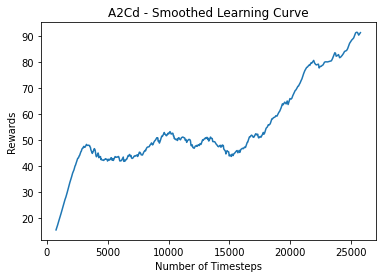

/usr/local/lib/python3.6/dist-packages/stable_baselines/common/callbacks.py:277: UserWarning: Training and eval env are not of the same type<stable_baselines.common.base_class._UnvecWrapper object at 0x7fb4d5d133c8> != <stable_baselines.common.vec_env.dummy_vec_env.DummyVecEnv object at 0x7fb4d5d13198>
  "{} != {}".format(self.training_env, self.eval_env))


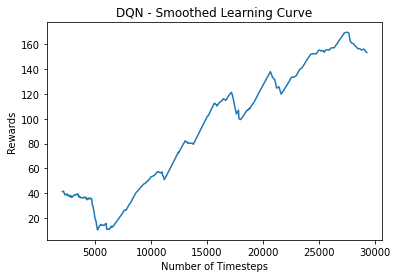

/usr/local/lib/python3.6/dist-packages/stable_baselines/common/callbacks.py:277: UserWarning: Training and eval env are not of the same type<stable_baselines.common.base_class._UnvecWrapper object at 0x7fb4d49223c8> != <stable_baselines.common.vec_env.dummy_vec_env.DummyVecEnv object at 0x7fb4d4922240>
  "{} != {}".format(self.training_env, self.eval_env))


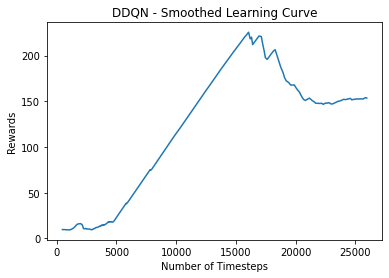

/usr/local/lib/python3.6/dist-packages/stable_baselines/common/callbacks.py:277: UserWarning: Training and eval env are not of the same type<stable_baselines.common.base_class._UnvecWrapper object at 0x7fb4d2d64a58> != <stable_baselines.common.vec_env.dummy_vec_env.DummyVecEnv object at 0x7fb4d2d64198>
  "{} != {}".format(self.training_env, self.eval_env))


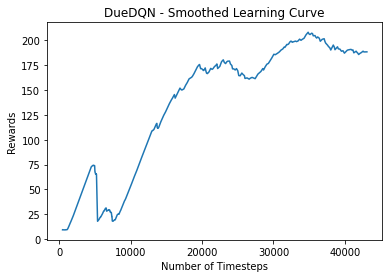

/usr/local/lib/python3.6/dist-packages/stable_baselines/common/callbacks.py:277: UserWarning: Training and eval env are not of the same type<stable_baselines.common.base_class._UnvecWrapper object at 0x7fb4d100b5f8> != <stable_baselines.common.vec_env.dummy_vec_env.DummyVecEnv object at 0x7fb4d100b9b0>
  "{} != {}".format(self.training_env, self.eval_env))


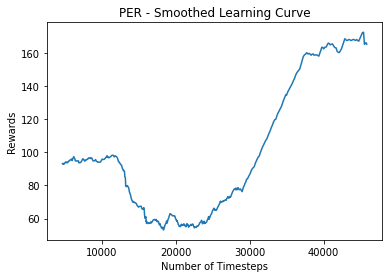

/usr/local/lib/python3.6/dist-packages/stable_baselines/common/callbacks.py:277: UserWarning: Training and eval env are not of the same type<stable_baselines.common.base_class._UnvecWrapper object at 0x7fb4d61ecc18> != <stable_baselines.common.vec_env.dummy_vec_env.DummyVecEnv object at 0x7fb4d4942d68>
  "{} != {}".format(self.training_env, self.eval_env))


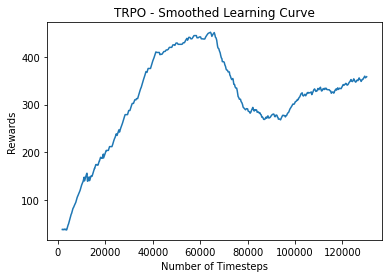

0

In [19]:
train_save_env(MODEL_LIST_DISCRETE, env_name_discrete, log_dir_call, log_dir_tsbd, log_dir_models, l_steps=n_steps)

In [20]:
load_eval_env(MODEL_LIST_DISCRETE, env_name_discrete, log_dir_call, log_dir_tsbd, log_dir_models, episodes=n_episodes)

Loading a model without an environment, this model cannot be trained until it has a valid environment.

A2Cd - mean reward: 22.636363983154297; #episodes: 500
Loading a model without an environment, this model cannot be trained until it has a valid environment.
DQN - mean reward: 165.33333333333334; #episodes: 500
Loading a model without an environment, this model cannot be trained until it has a valid environment.
DDQN - mean reward: 140.33333333333334; #episodes: 500
Loading a model without an environment, this model cannot be trained until it has a valid environment.
DueDQN - mean reward: 236.0; #episodes: 500
Loading a model without an environment, this model cannot be trained until it has a valid environment.
PER - mean reward: 122.0; #episodes: 500
Loading a model without an environment, this model cannot be trained until it has a valid environment.
TRPO - mean reward: 166.0; #episodes: 500


0

#### Visual Debug

In [0]:
# Set up fake display; otherwise rendering will fail
import os
os.system("Xvfb :1 -screen 0 1024x768x24 &")
os.environ['DISPLAY'] = ':1'

In [0]:
import base64
from pathlib import Path
from IPython import display as ipythondisplay

def show_videos(video_path='', prefix=''):
  """
  Taken from https://github.com/eleurent/highway-env

  :param video_path: (str) Path to the folder containing videos
  :param prefix: (str) Filter the video, showing only the only starting with this prefix
  """
  html = []
  for mp4 in Path(video_path).glob("{}*.mp4".format(prefix)):
      video_b64 = base64.b64encode(mp4.read_bytes())
      html.append('''<video alt="{}" autoplay 
                    loop controls style="height: 400px;">
                    <source src="data:video/mp4;base64,{}" type="video/mp4" />
                </video>'''.format(mp4, video_b64.decode('ascii')))
  ipythondisplay.display(ipythondisplay.HTML(data="<br>".join(html)))

In [0]:
from stable_baselines.common.vec_env import VecVideoRecorder, DummyVecEnv

def record_video(env_id, model, video_length=500, prefix='', video_folder='videos/'):
  """
  :param env_id: (str)
  :param model: (RL model)
  :param video_length: (int)
  :param prefix: (str)
  :param video_folder: (str)
  """
  eval_env = DummyVecEnv([lambda: gym.make(env_id)])
  # Start the video at step=0 and record 500 steps
  eval_env = VecVideoRecorder(eval_env, video_folder=video_folder,
                              record_video_trigger=lambda step: step == 0, video_length=video_length,
                              name_prefix=prefix)

  obs = eval_env.reset()
  for _ in range(video_length):
    action, _ = model.predict(obs)
    obs, _, _, _ = eval_env.step(action)

  # Close the video recorder
  eval_env.close()

In [0]:
def display_model_video(env_name, model_name, model_class, dir_models, video_length=500, video_folder='videos/'):

  dir_deserialize = os.path.join(dir_models, model_name)
  model = model_class[model_name].load(dir_deserialize, verbose=1)
  model.set_env(DummyVecEnv([lambda: gym.make(env_name)]))

  model_prefix = model_name + '-' + env_name

  record_video(env_name, model, video_length, model_prefix, video_folder)

  show_videos('videos', prefix=model_name)

  del model

#### Test any model

In [25]:
display_model_video(env_name_discrete, 'DQN', MODEL_LIST_DISCRETE, log_dir_models, video_length=n_frames)

Loading a model without an environment, this model cannot be trained until it has a valid environment.
Saving video to  /content/videos/DQN-CartPole-v1-step-0-to-step-500.mp4


### Test continuous env version

In [26]:
from google.colab import drive

drive.mount('/content/drive/')

!unzip -q "/content/drive/My Drive/notebooks/meetup_DLLisbon/gym-cartpole-continuous.zip"
!pip install -e gym-cartpole-continuous

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive/
Obtaining file:///content/gym-cartpole-continuous
  Running setup.py develop for gym-cartpole-continuous


In [27]:
!ls "/content/"

drive  gym-cartpole-continuous	sample_data  videos


In [28]:
!ls "/content/gym-cartpole-continuous"

gym_cartpole_continuous  gym_cartpole_continuous.egg-info  setup.py


In [0]:
!cp -R "/content/gym-cartpole-continuous/gym_cartpole_continuous" "/content/"

In [30]:
!ls "/content/"

drive  gym_cartpole_continuous	gym-cartpole-continuous  sample_data  videos


In [0]:
import gym
import gym_cartpole_continuous
from stable_baselines.common.env_checker import check_env

In [0]:
env_name_continuous = 'CartpoleContinuous-v0'

In [33]:
#@title Environment imported from [here](https://gist.github.com/iandanforth/e3ffb67cf3623153e968f2afdfb01dc8)
env_continuous = gym.make(env_name_continuous)
check_env(env_continuous)

/usr/local/lib/python3.6/dist-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


/usr/local/lib/python3.6/dist-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


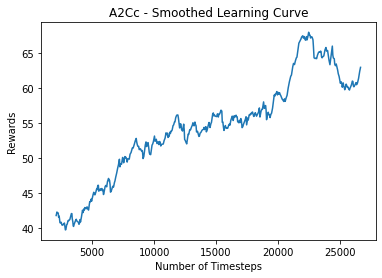

Instructions for updating:
Use keras.layers.Dense instead.


/usr/local/lib/python3.6/dist-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))
/usr/local/lib/python3.6/dist-packages/stable_baselines/common/callbacks.py:277: UserWarning: Training and eval env are not of the same type<stable_baselines.common.base_class._UnvecWrapper object at 0x7fb4bfea4860> != <stable_baselines.common.vec_env.dummy_vec_env.DummyVecEnv object at 0x7fb4bfea47f0>
  "{} != {}".format(self.training_env, self.eval_env))


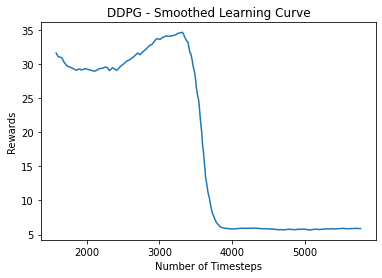

0

In [34]:
train_save_env(MODEL_LIST_CONTINUOUS, env_name_continuous, log_dir_call, log_dir_tsbd, log_dir_models, l_steps=n_steps)

In [35]:
load_eval_env(MODEL_LIST_CONTINUOUS, env_name_continuous, log_dir_call, log_dir_tsbd, log_dir_models, episodes=n_episodes)

Loading a model without an environment, this model cannot be trained until it has a valid environment.


/usr/local/lib/python3.6/dist-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


A2Cc - mean reward: 46.5; #episodes: 500
Loading a model without an environment, this model cannot be trained until it has a valid environment.
DDPG - mean reward: 5.8023255813953485; #episodes: 500


0

In [36]:
display_model_video(env_name_continuous, 'DDPG', MODEL_LIST_CONTINUOUS, log_dir_models, video_length=n_frames)

Loading a model without an environment, this model cannot be trained until it has a valid environment.


/usr/local/lib/python3.6/dist-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


Saving video to  /content/videos/DDPG-CartpoleContinuous-v0-step-0-to-step-500.mp4


## Some fun with pre-baked reports using [bsuite](https://github.com/deepmind/bsuite)

In [0]:
#@title Installing bsuite
%%capture
!git clone https://github.com/deepmind/bsuite.git
!pip install bsuite/
!pip install gcsfs

In [0]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import warnings
import numpy as np
import pandas as pd
import plotnine as gg

from bsuite.experiments import summary_analysis
from bsuite.logging import csv_load
from bsuite.logging import sqlite_load

pd.options.mode.chained_assignment = None
gg.theme_set(gg.theme_bw(base_size=16, base_family='serif'))
gg.theme_update(figure_size=(12, 8), panel_spacing_x=0.5, panel_spacing_y=0.5)
warnings.filterwarnings('ignore')

### Output from Agents

In [0]:
#@title Loading results from pre-cached runs (requires gcfs)
DF = pd.read_csv('gs://bsuite-colab-images/saved_data/agent_data.csv')
SWEEP_VARS = ['experiment']

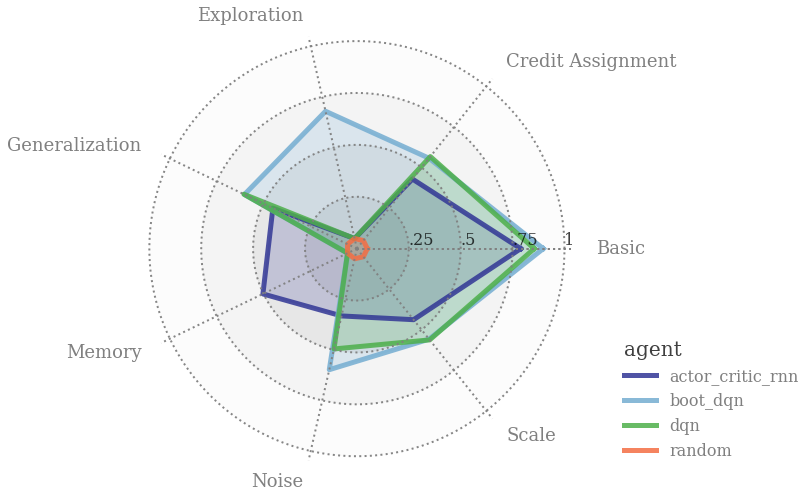

In [40]:
#@title overall score as radar plot (double-click to show/hide code)
BSUITE_SCORE = summary_analysis.bsuite_score(DF, SWEEP_VARS)
BSUITE_SUMMARY = summary_analysis.ave_score_by_tag(BSUITE_SCORE, SWEEP_VARS)
__radar_fig__ = summary_analysis.bsuite_radar_plot(BSUITE_SUMMARY, SWEEP_VARS)

In [0]:
#@title Import experiment-specific analysis
from bsuite.experiments.cartpole import analysis as cartpole_analysis
from bsuite.experiments.cartpole_noise import analysis as cartpole_noise_analysis
from bsuite.experiments.cartpole_scale import analysis as cartpole_scale_analysis
from bsuite.experiments.cartpole_swingup import analysis as cartpole_swingup_analysis

#### **Basic** experiment

We begin with a collection of very simple decision problems with standard analysis:
- Does the agent learn a reasonable rewarding policy?
- How quickly do they learn simple tasks?

We call these experiments "basic", since they are not particularly targeted at specific core issues.

- Run 1000 episodes for 20 seeds.

tags=('basic', 'credit_assignment', 'generalization')


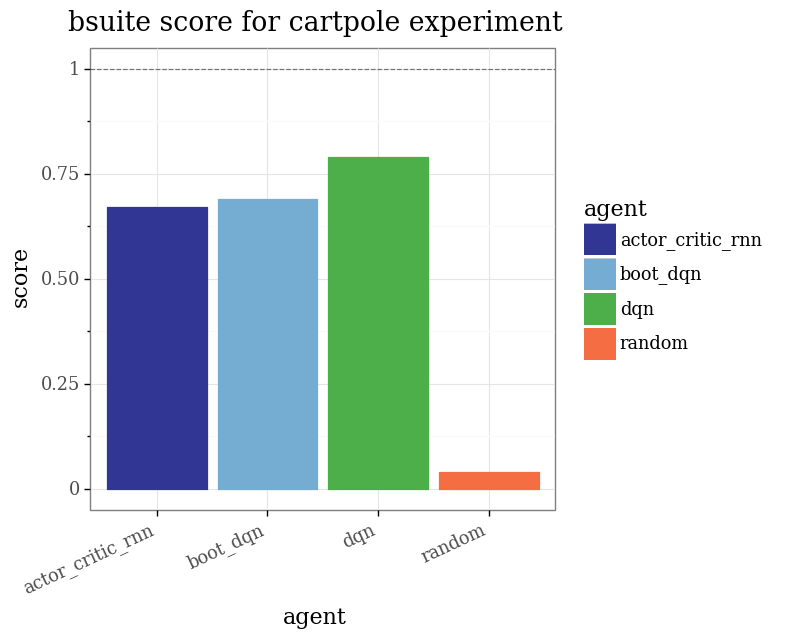

<ggplot: (-9223363260977896034)>

In [42]:
#@title parsing data
cartpole_df = DF[DF.bsuite_env == 'cartpole'].copy()
summary_analysis.plot_single_experiment(BSUITE_SCORE, 'cartpole', SWEEP_VARS)

**Parsing the plot below:**

- Here we can see the performance of the agent averaged over 20 seeds.
- Maximum regret of 1000 per episode = dashed line
- Want to see a stable learning curve -> 0 and fast!
- Smoothing is performed with rolling mean over 10% of data with confidence bar at 95% Gaussian standard error.

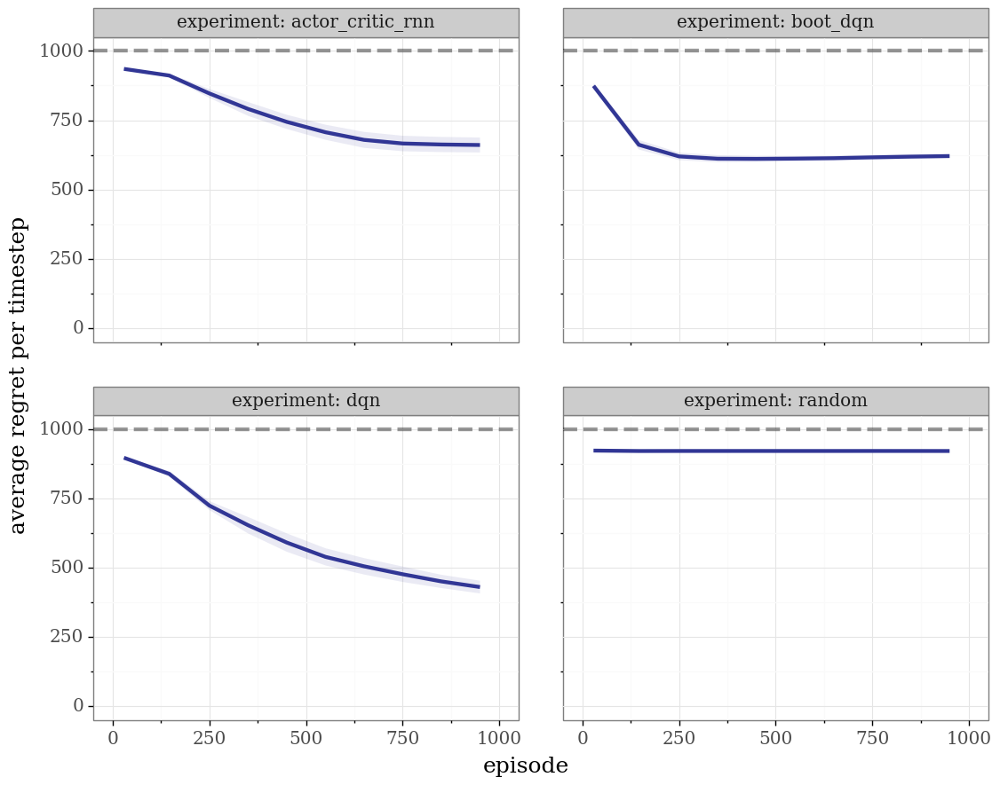

<ggplot: (8775914888477)>

In [43]:
#@title plot average regret through learning (lower is better)
cartpole_analysis.plot_learning(cartpole_df, SWEEP_VARS)

**Parsing the plot below:**

- Here we can see the performance of each agent individually through time.
- Higher scores are better, but individual runs may be noisy.
- Use this plot to diagnose strange agent behaviour.

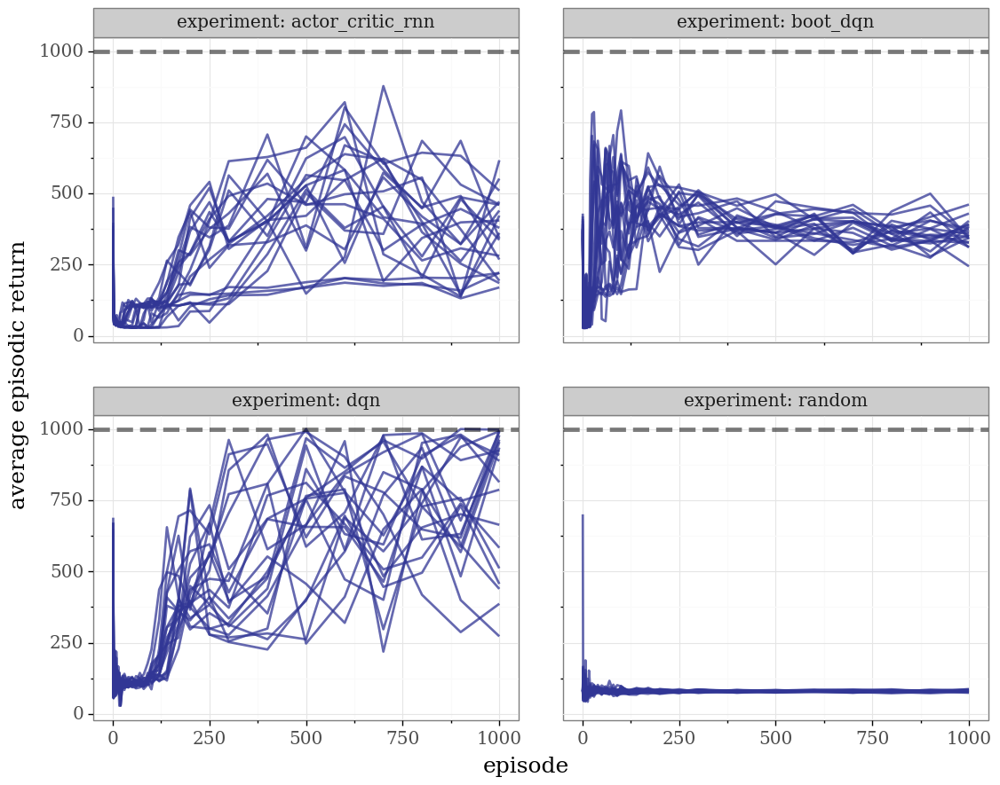

<ggplot: (8775876707041)>

In [44]:
#@title plot performance by seed (higher is better)
cartpole_analysis.plot_seeds(cartpole_df, SWEEP_VARS)

#### **Reward Noise** experiment

To investigate the robustness of RL agents to noisy rewards, we repeat the "basic" experiments under differing levels of Gaussian noise.

This time we allocate the 20 different seeds across 5 levels of Gaussian noise $N(0, \sigma^2)$ for $\sigma$ = noise\_scale = $[0.1, 0.3, 1, 3, 10]$ with 4 seeds each.

- Run noise_scale = [0.1, 0.3, 1., 3, 10] for 4 seeds for 1k episodes.

tags=('noise', 'generalization')


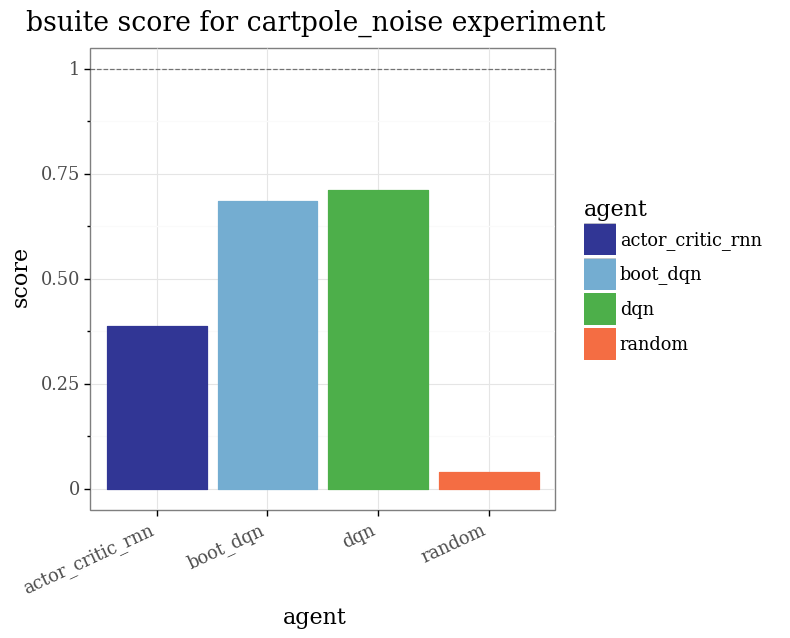

<ggplot: (8775876638440)>

In [45]:
#@title parsing  data
cartpole_noise_df = DF[DF.bsuite_env == 'cartpole_noise'].copy()
summary_analysis.plot_single_experiment(BSUITE_SCORE, 'cartpole_noise', SWEEP_VARS)

**Parsing the plot below:**
- Display the average regret after 10k episodes by noise_scale (lower is better)
- Dashed line shows the performance of a random agents.
- Look for largest noise_scale with performance significantly better than random agent.

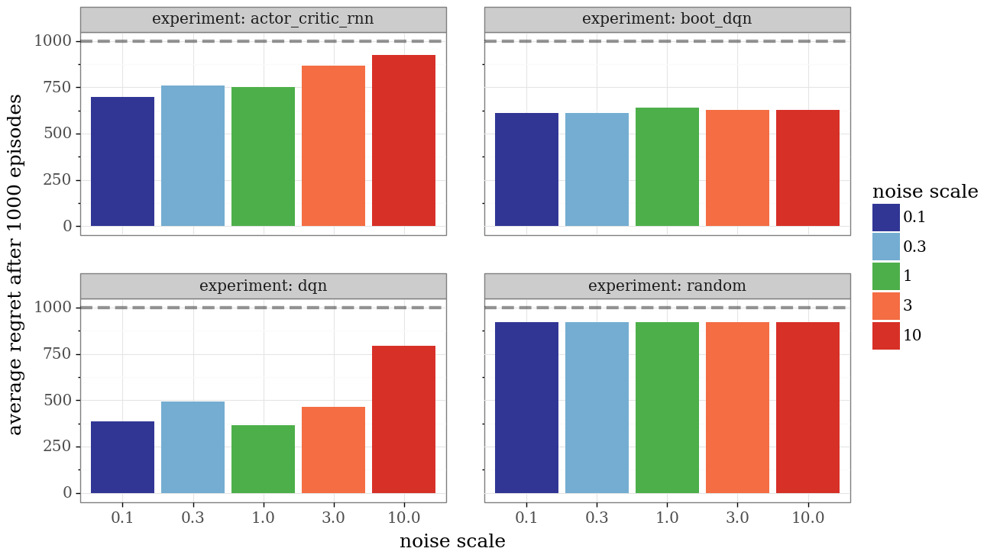

<ggplot: (8775876526810)>

In [46]:
#@title average regret over learning (lower is better)
cartpole_noise_analysis.plot_average(cartpole_noise_df, SWEEP_VARS)

**Parsing the plot below:**
- Display the average regret after 10k episodes by noise_scale (lower is better)
- Dashed line shows the performance of a random agent baseline.
- Look for largest noise_scale with performance significantly better than baseline.

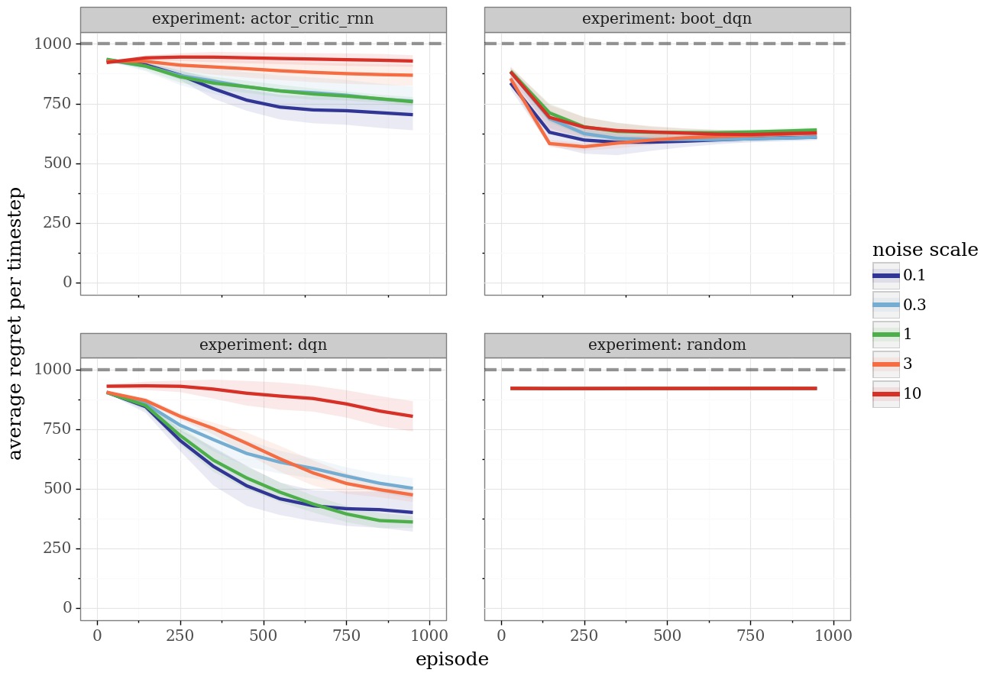

<ggplot: (8775876340095)>

In [47]:
#@title average regret through learning (lower is better)
cartpole_noise_analysis.plot_learning(cartpole_noise_df, SWEEP_VARS)

**Parsing the plot below:**

- Here we can see the performance of each agent individually through time.
- Higher scores are better, but individual runs may be noisy.
- Use this plot to diagnose strange agent behaviour.

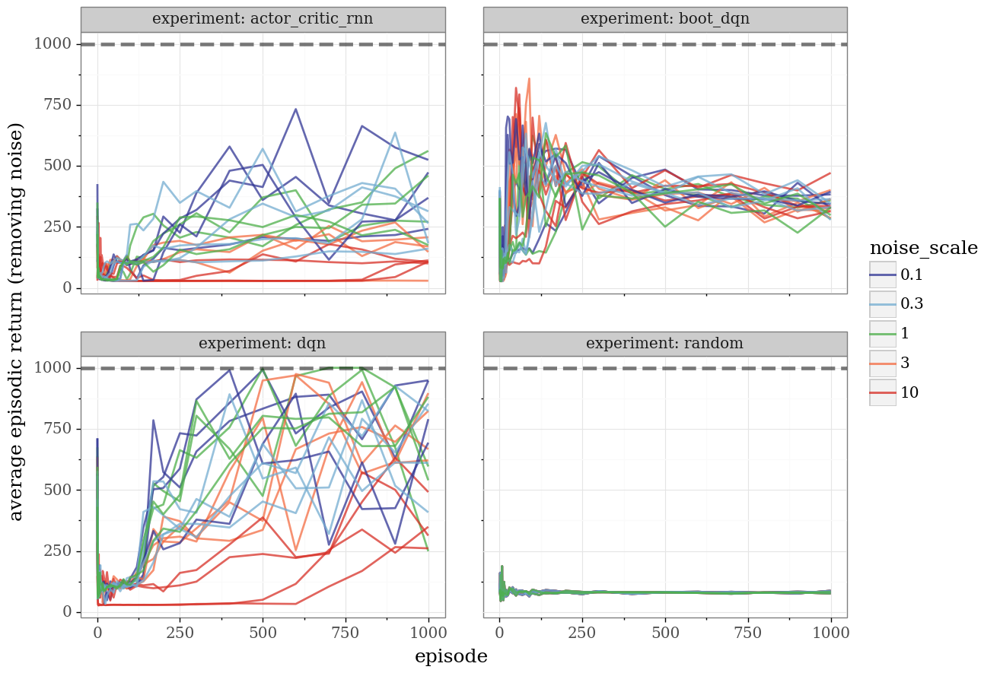

<ggplot: (8775876807663)>

In [48]:
#@title plot performance by seed (higher is better)
cartpole_noise_analysis.plot_seeds(cartpole_noise_df, SWEEP_VARS)

#### **Reward Scale** experiment

To investigate the robustness of RL agents to reward rewards, we repeat the "basic" experiments under differing levels of problem rescaling.

This time we allocate the 20 different seeds across 5 levels of reward\_scale = $[0.1, 0.3, 1, 3, 10]$ with 4 seeds each.

In order to keep comparable statistics/regret we report rescaled regret/reward\_scale.

- Run reward_scale = [0.01, 0.1, 1., 10, 100] for 4 seeds for 1k episodes.

tags=('scale', 'generalization')


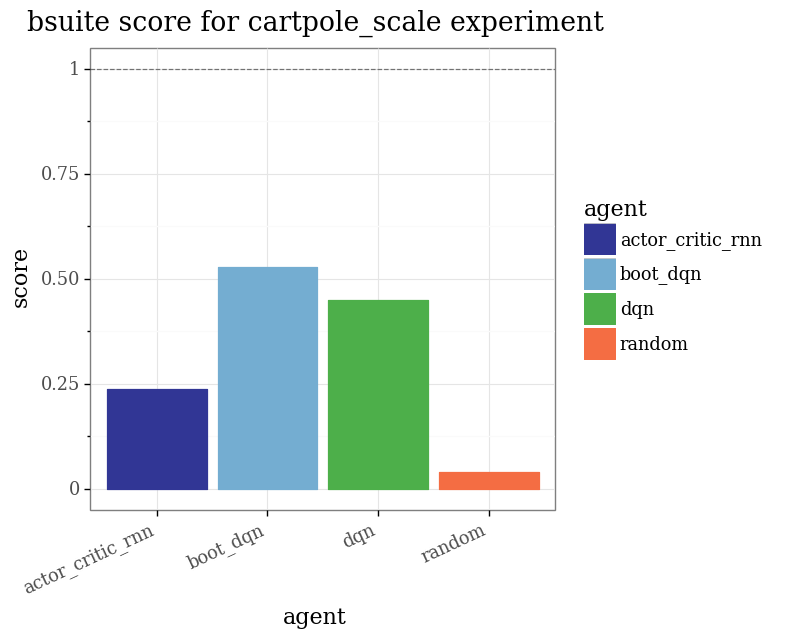

<ggplot: (8775876507761)>

In [49]:
#@title parsing data
cartpole_scale_df = DF[DF.bsuite_env == 'cartpole_scale'].copy()
summary_analysis.plot_single_experiment(BSUITE_SCORE, 'cartpole_scale', SWEEP_VARS)

**Parsing the plot below:**
- Display the average regret after 10k episodes by reward_scale (lower is better)
- Dashed line shows the performance of a random agents.
- Look for reward_scale with performance significantly better than random agent.

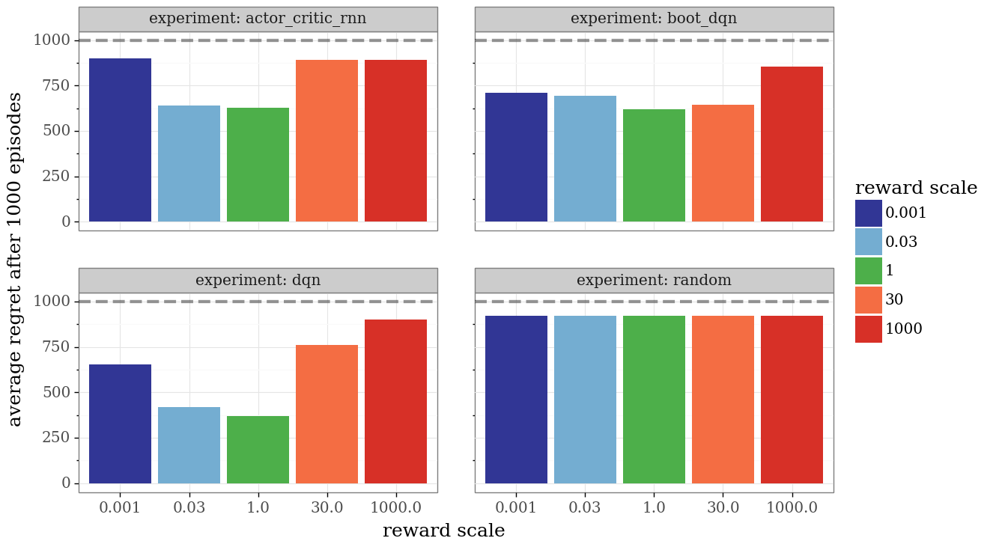

<ggplot: (8775876116614)>

In [50]:
#@title average regret over learning (lower is better)
cartpole_scale_analysis.plot_average(cartpole_scale_df, SWEEP_VARS)

**Parsing the plot below:**
- Display the average regret after 10k episodes by reward_scale (lower is better)
- Dashed line shows the performance of a random agent baseline.
- Look for reward_scale with performance significantly better than baseline.

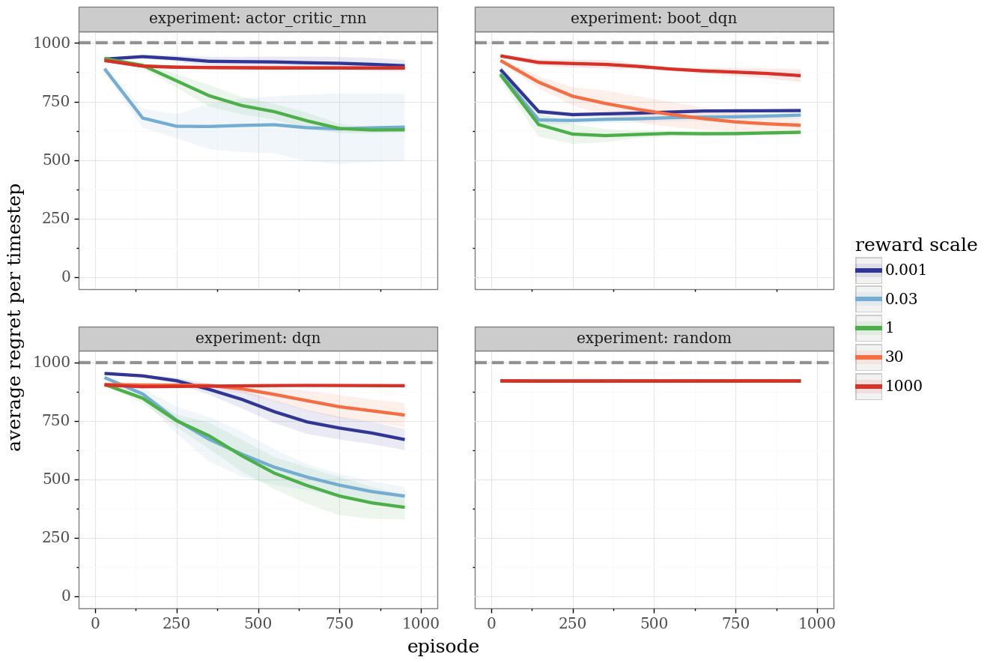

<ggplot: (-9223363260978611021)>

In [51]:
#@title average regret through learning (lower is better)
cartpole_scale_analysis.plot_learning(cartpole_scale_df, SWEEP_VARS)

**Parsing the plot below:**

- Here we can see the performance of each agent individually through time.
- Higher scores are better, but individual runs may be noisy.
- Use this plot to diagnose strange agent behaviour.

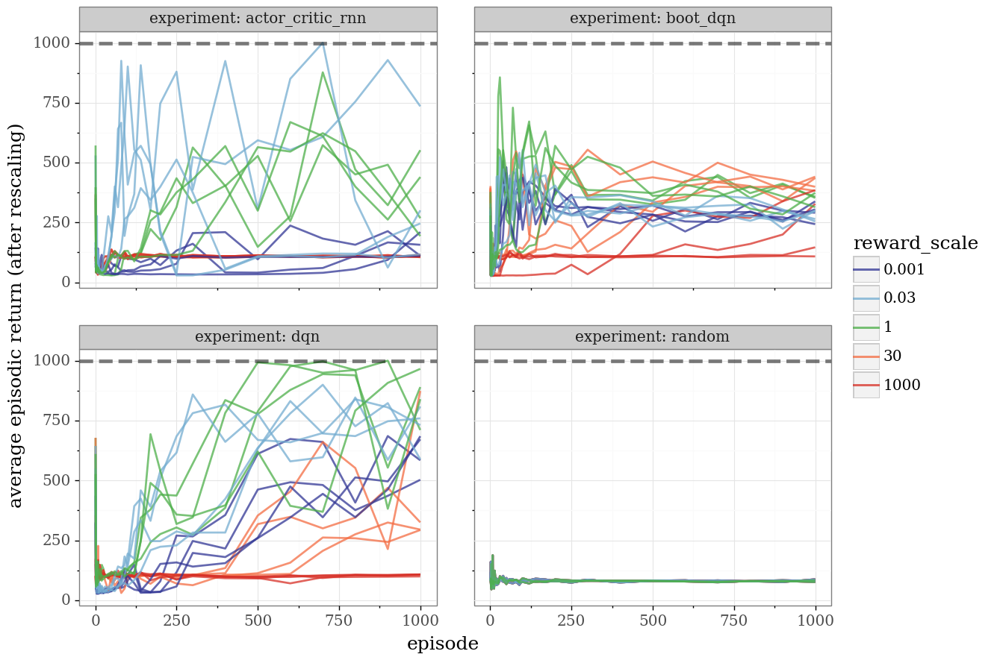

<ggplot: (-9223363260978459041)>

In [52]:
#@title plot performance by seed (higher is better)
cartpole_scale_analysis.plot_seeds(cartpole_scale_df, SWEEP_VARS)

#### **Exploration** experiment

Exploration is the problem of prioritizing useful information for learning.

A difficult cartpole swingup task with sparse rewards and a cost for moving.
This domain is somewhat similar to "deep sea" but cannot be solved easily by tabular reinforcement learning algorithms.

- The observation is `[x, cos_theta, sin_theta, x_dot, theta_dot, x_central]`
- The dynamics are given by the classic cartpole from dm [control suite](https://github.com/deepmind/dm_control/blob/master/all_domains.png)
- Each episode begins with the pole hanging downwards and ends after 1000 timesteps.
- There is a small cost of -0.1 for any movement of the pole.
- There is a reward of +1 only if:
  - x_dot, theta_dot < 1
  - pole_height > 1 - `difficulty_scale`
  - x < 1 - `difficulty_scale`

The parameter `difficulty_scale` acts as a scaling for the depth of exploration, similar to the "size" in deep sea.
To run this experiment:

- Run the agent on difficulty_scale = 0, 0.05, 0.1, .. , 0.95 for 1k episodes
- Score is proportion of runs that achieve an average_return > 0 at any point.
- Must log `episode`, `total_return` for standard analysis

tags=('exploration', 'generalization')


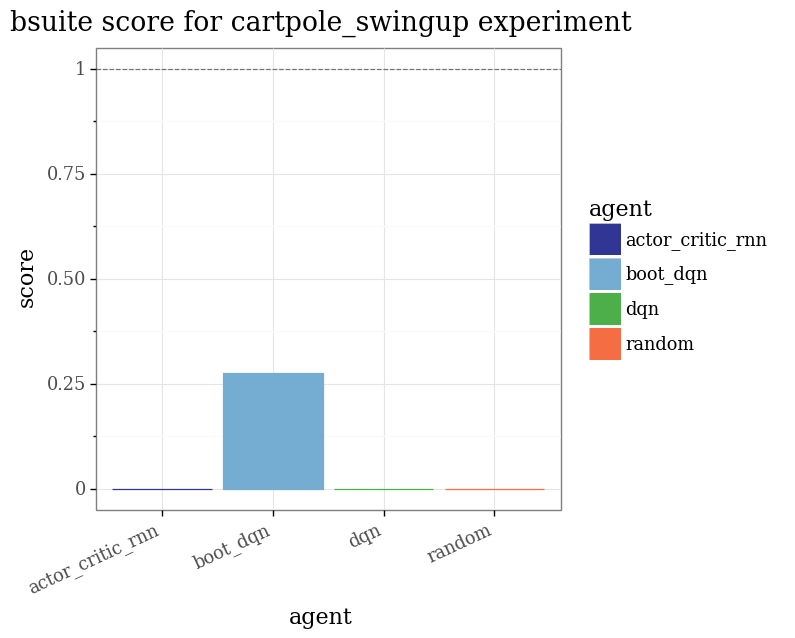

<ggplot: (8775875847123)>

In [53]:
#@title parsing data
cartpole_swingup_df = DF[DF.bsuite_env == 'cartpole_swingup'].copy()
summary_analysis.plot_single_experiment(BSUITE_SCORE, 'cartpole_swingup', SWEEP_VARS)

**Parsing the plot below:**
- For each height threshold, look at the best observed return.
- If the observed return is greater than 500 ==> the pole was swung upright and balanced for at least 5 seconds.
- Look for higher scores and more blue.

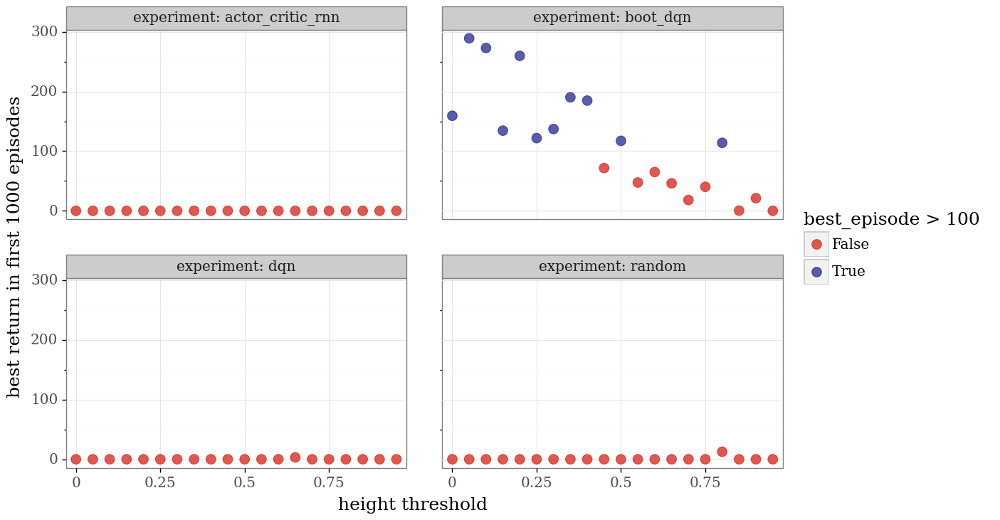

<ggplot: (8775875516473)>

In [54]:
#@title scaling with difficulty scale (higher + more blue is better)
cartpole_swingup_analysis.plot_scale(cartpole_swingup_df, SWEEP_VARS)

**Parsing the plot below:**
- Learning curves of average return through time (higher is better).
- Dashed line shows the performance of an agent that does not move = 0.
- Look for largest difficulty_scale with performance significantly better than staying still.

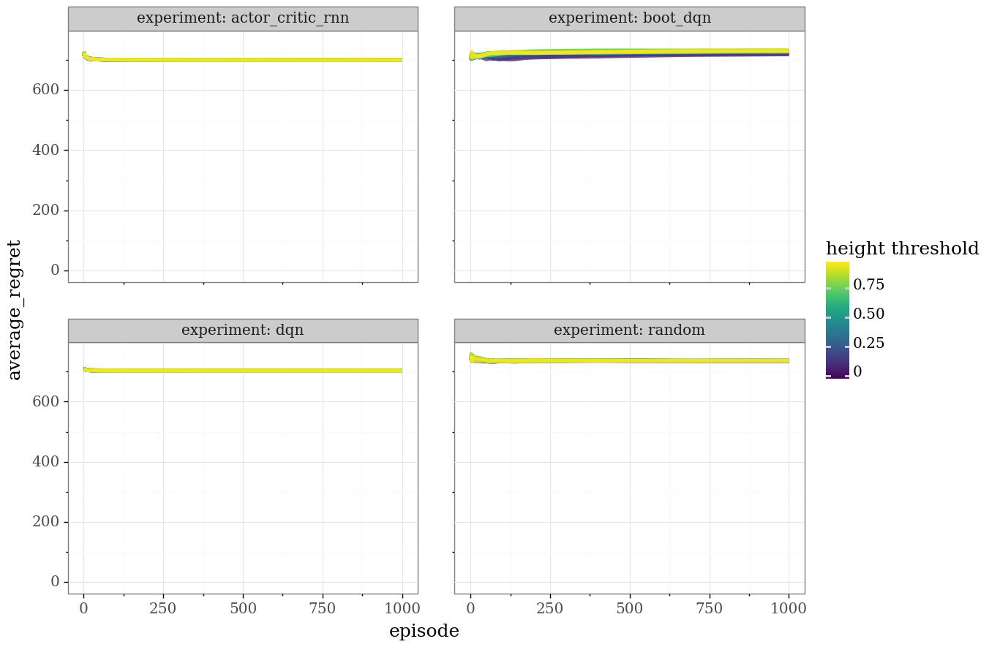

<ggplot: (8775875447763)>

In [55]:
#@title average regret through learning (lower is better)
cartpole_swingup_analysis.plot_learning(cartpole_swingup_df, SWEEP_VARS)

**Parsing the plot below:**

- Here we can see the performance of each agent individually through time.
- Higher scores are better, but individual runs may be noisy.
- Use this plot to diagnose strange agent behaviour.

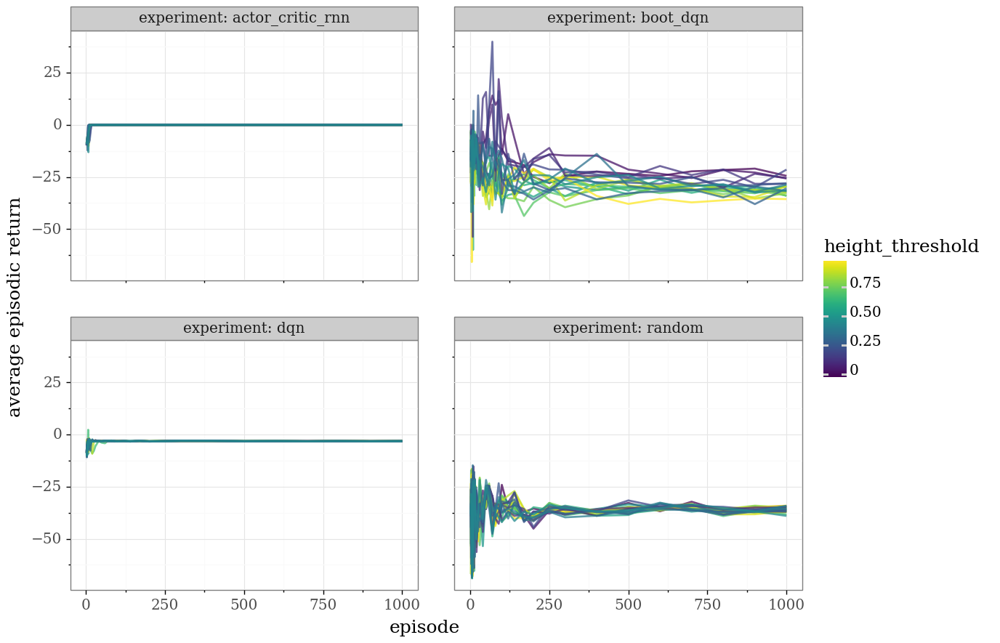

<ggplot: (-9223363260979542584)>

In [56]:
#@title plot performance by seed (higher is better)
cartpole_swingup_analysis.plot_seeds(cartpole_swingup_df, SWEEP_VARS)

### Output from Optimizers

In [0]:
#@title Loading results from pre-cached runs (requires gcfs)
DF = pd.read_csv('gs://bsuite-colab-images/saved_data/optim_data.csv')
SWEEP_VARS = ['optimizer']

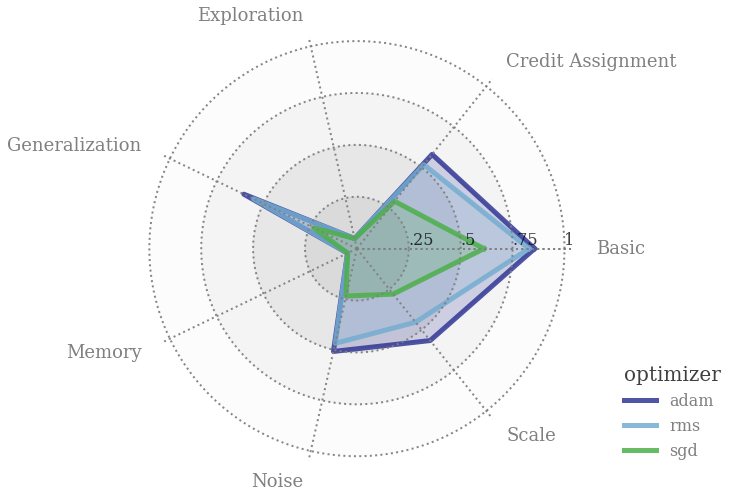

In [58]:
#@title overall score as radar plot (double-click to show/hide code)
BSUITE_SCORE = summary_analysis.bsuite_score(DF, SWEEP_VARS)
BSUITE_SUMMARY = summary_analysis.ave_score_by_tag(BSUITE_SCORE, SWEEP_VARS)
__radar_fig__ = summary_analysis.bsuite_radar_plot(BSUITE_SUMMARY, SWEEP_VARS)

#### **Basic** experiment

tags=('basic', 'credit_assignment', 'generalization')


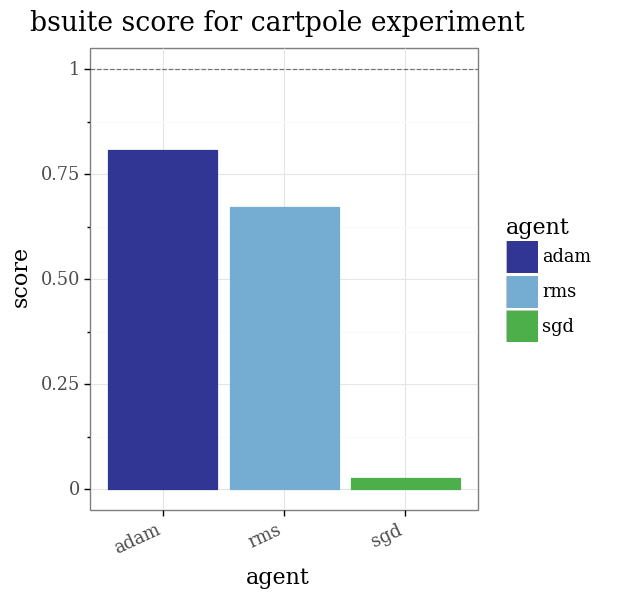

<ggplot: (-9223363260977627041)>

In [59]:
#@title parsing data
cartpole_df = DF[DF.bsuite_env == 'cartpole'].copy()
summary_analysis.plot_single_experiment(BSUITE_SCORE, 'cartpole', SWEEP_VARS)

**Parsing the plot below:**

- Here we can see the performance of the agent averaged over 20 seeds.
- Maximum regret of 1000 per episode = dashed line
- Want to see a stable learning curve -> 0 and fast!
- Smoothing is performed with rolling mean over 10% of data with confidence bar at 95% Gaussian standard error.

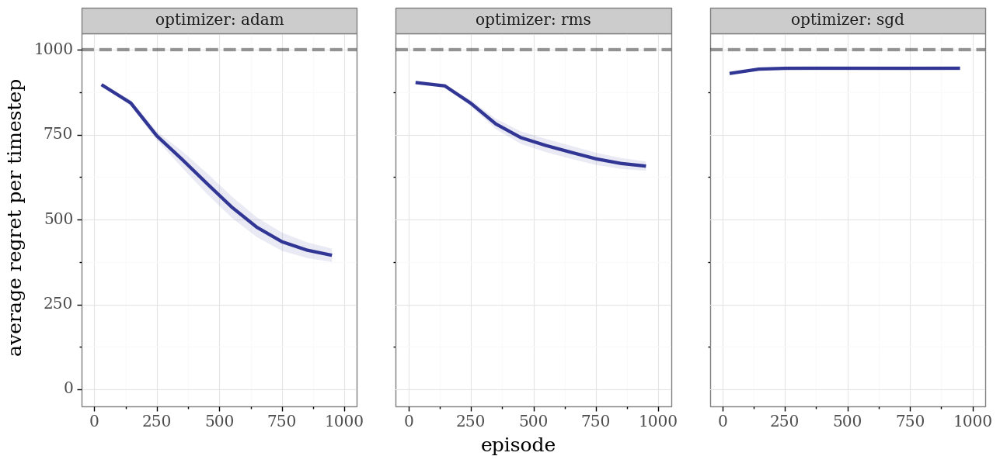

<ggplot: (-9223363260979542563)>

In [60]:
#@title plot average regret through learning (lower is better)
cartpole_analysis.plot_learning(cartpole_df, SWEEP_VARS)

**Parsing the plot below:**

- Here we can see the performance of each agent individually through time.
- Higher scores are better, but individual runs may be noisy.
- Use this plot to diagnose strange agent behaviour.

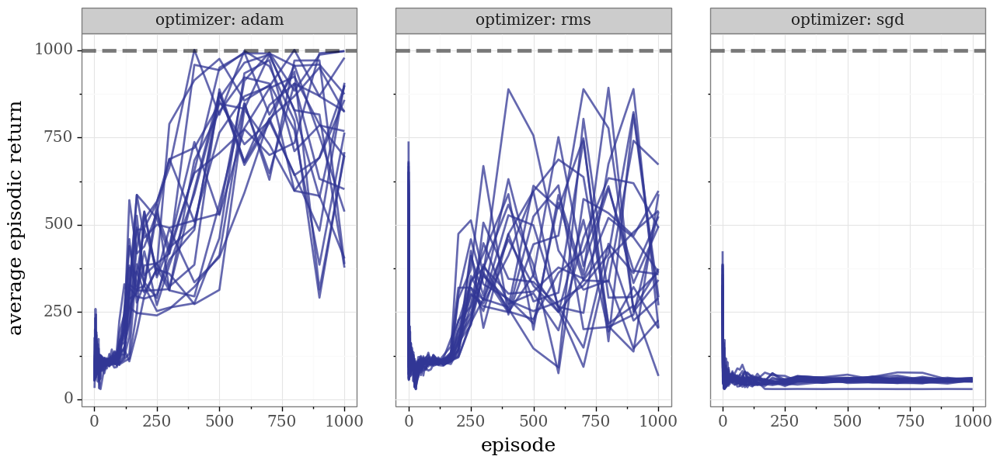

<ggplot: (-9223363260979627253)>

In [61]:
#@title plot performance by seed (higher is better)
cartpole_analysis.plot_seeds(cartpole_df, SWEEP_VARS)

#### **Reward noise** experiment

tags=('noise', 'generalization')


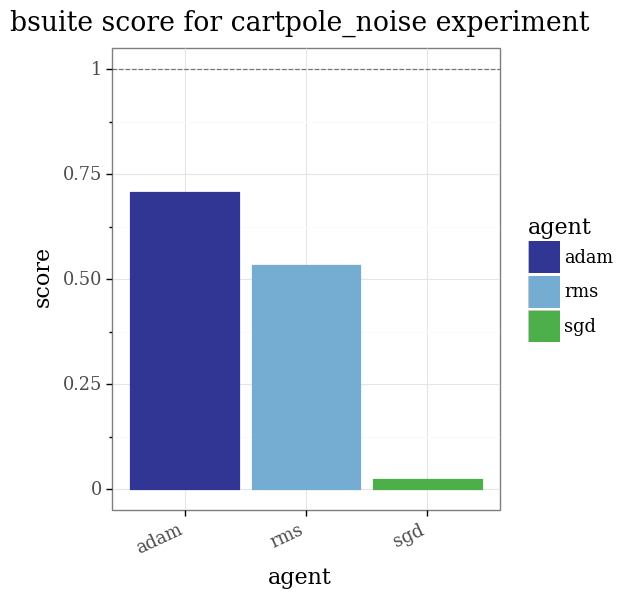

<ggplot: (8775876806846)>

In [62]:
#@title parsing  data
cartpole_noise_df = DF[DF.bsuite_env == 'cartpole_noise'].copy()
summary_analysis.plot_single_experiment(BSUITE_SCORE, 'cartpole_noise', SWEEP_VARS)

**Parsing the plot below:**
- Display the average regret after 10k episodes by noise_scale (lower is better)
- Dashed line shows the performance of a random agents.
- Look for largest noise_scale with performance significantly better than random agent.

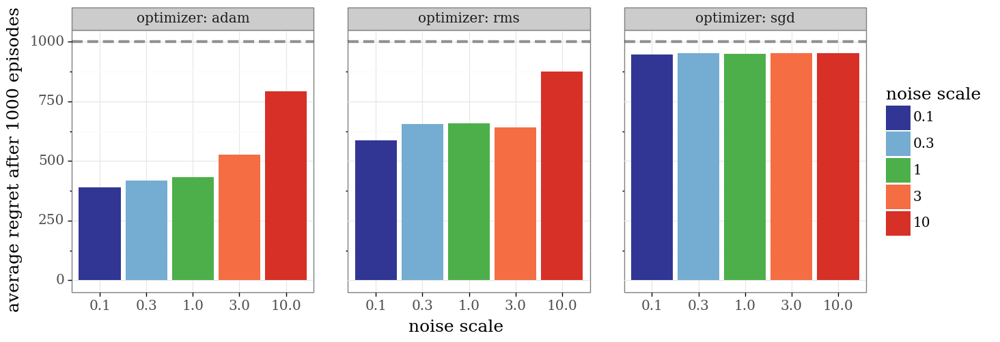

<ggplot: (8775876303294)>

In [63]:
#@title average regret over learning (lower is better)
cartpole_noise_analysis.plot_average(cartpole_noise_df, SWEEP_VARS)

**Parsing the plot below:**
- Display the average regret after 10k episodes by noise_scale (lower is better)
- Dashed line shows the performance of a random agent baseline.
- Look for largest noise_scale with performance significantly better than baseline.

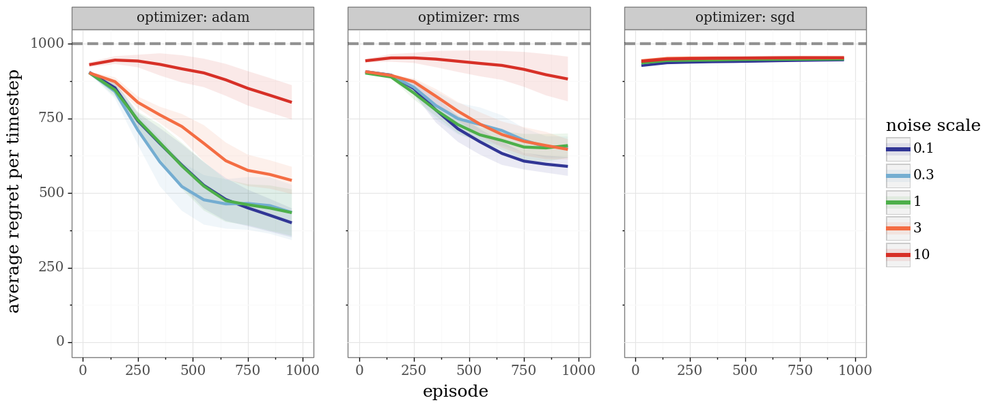

<ggplot: (8775876640797)>

In [64]:
#@title average regret through learning (lower is better)
cartpole_noise_analysis.plot_learning(cartpole_noise_df, SWEEP_VARS)

**Parsing the plot below:**

- Here we can see the performance of each agent individually through time.
- Higher scores are better, but individual runs may be noisy.
- Use this plot to diagnose strange agent behaviour.

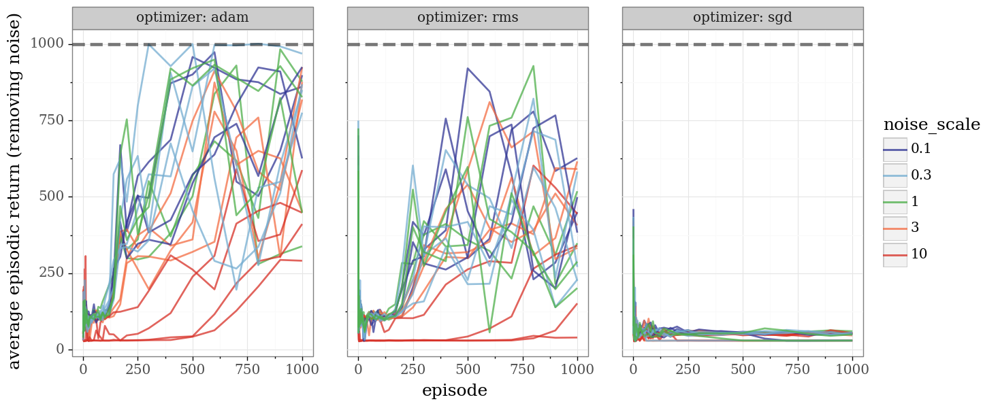

<ggplot: (-9223363260977968980)>

In [65]:
#@title plot performance by seed (higher is better)
cartpole_noise_analysis.plot_seeds(cartpole_noise_df, SWEEP_VARS)